# Import neccessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
# Load the dataset
df = pd.read_csv(r"C:\Users\admin\OneDrive\Desktop\PROJECT-8\PROJECT-8-1\all_upwork_jobs_2024-02-07-2024-03-24.csv")

# Explore and preprocess the data

In [3]:
df.head()

,title,link,published_date,is_hourly,hourly_low,hourly_high,budget,country
0,Experienced Media Buyer For Solar Pannel and R...,https://www.upwork.com/jobs/Experienced-Media-...,2024-02-17 09:09:54+00:00,False,NaN,NaN,500.0,NaN
1,Full Stack Developer,https://www.upwork.com/jobs/Full-Stack-Develop...,2024-02-17 09:09:17+00:00,False,NaN,NaN,1100.0,United States
2,SMMA Bubble App,https://www.upwork.com/jobs/SMMA-Bubble-App_%7...,2024-02-17 09:08:46+00:00,True,10.0,30.0,NaN,United States
3,Talent Hunter Specialized in Marketing,https://www.upwork.com/jobs/Talent-Hunter-Spec...,2024-02-17 09:08:08+00:00,True,NaN,NaN,NaN,United States
4,Data Engineer,https://www.upwork.com/jobs/Data-Engineer_%7E0...,2024-02-17 09:07:42+00:00,False,NaN,NaN,650.0,India


In [4]:
df.shape

(244828, 8)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244828 entries, 0 to 244827
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   title           244827 non-null  object 
 1   link            244827 non-null  object 
 2   published_date  244828 non-null  object 
 3   is_hourly       244828 non-null  bool   
 4   hourly_low      102422 non-null  float64
 5   hourly_high     98775 non-null   float64
 6   budget          103891 non-null  float64
 7   country         239751 non-null  object 
dtypes: bool(1), float64(3), object(4)
memory usage: 13.3+ MB


In [6]:
df.describe()

,hourly_low,hourly_high,budget
count,102422.000000,98775.000000,103891.000000
mean,17.339644,41.970610,911.473564
std,18.140065,47.850892,15729.738834
min,3.000000,3.000000,5.000000
25%,8.000000,20.000000,25.000000
50%,15.000000,30.000000,100.000000
75%,20.000000,50.000000,300.000000
max,998.000000,999.000000,1000000.000000


In [7]:
df.isnull().sum()

title                  1
link                   1
published_date         0
is_hourly              0
hourly_low        142406
hourly_high       146053
budget            140937
country             5077
dtype: int64

In [8]:
# Impute missing hourly rates with mean
mean_hourly_low = df['hourly_low'].mean()
mean_hourly_high = df['hourly_high'].mean()

df['hourly_low'].fillna(mean_hourly_low, inplace=True)
df['hourly_high'].fillna(mean_hourly_high, inplace=True)

In [9]:
# Impute missing budget and country with mode (most frequent value)
mode_budget = df['budget'].mode()[0]
mode_country = df['country'].mode()[0]

df['budget'].fillna(mode_budget, inplace=True)
df['country'].fillna(mode_country, inplace=True)

In [10]:
# Check for missing values in 'title' and 'link'
missing_titles = df[df['title'].isnull()]
missing_links = df[df['link'].isnull()]

print(f"Number of missing titles: {len(missing_titles)}")
print(f"Number of missing links: {len(missing_links)}")

Number of missing titles: 1
Number of missing links: 1


In [11]:
# Manually replace missing 'title' and 'link'
if len(missing_titles) > 0:
    # Example: Replace missing 'title' with a placeholder or fetched from another source
    missing_title_index = missing_titles.index[0]
    df.at[missing_title_index, 'title'] = "Missing Title"

if len(missing_links) > 0:
    # Example: Replace missing 'link' with a placeholder or fetched from another source
    missing_link_index = missing_links.index[0]
    df.at[missing_link_index, 'link'] = "http://example.com"

In [12]:
# Check again for any remaining missing values
remaining_missing_titles = df[df['title'].isnull()]
remaining_missing_links = df[df['link'].isnull()]

print(f"Remaining missing titles after handling: {len(remaining_missing_titles)}")
print(f"Remaining missing links after handling: {len(remaining_missing_links)}")

Remaining missing titles after handling: 0
Remaining missing links after handling: 0


In [13]:
# Save the processed dataset
df.to_csv('handled_job_data.csv', index=False)


In [14]:
# Example: Text processing for 'title' and 'link'
df['title'] = df['title'].str.lower()  # Convert titles to lowercase
df['link'] = df['link'].str.strip()    # Remove leading/trailing whitespace

In [15]:
# Example: Convert 'published_date' to local time (assuming UTC)
df['published_date'] = pd.to_datetime(df['published_date'], utc=True).dt.tz_convert('America/New_York')  # Adjust time zone as needed

In [16]:
# Ensure correct data types
df['country'] = df['country'].astype('category')  # Convert 'country' to category type if not already
# No changes needed for 'is_hourly', 'hourly_low', 'hourly_high', 'budget' as they are already numeric types

In [17]:
# Verify data types after adjustments
print(df.dtypes)

title                                       object
link                                        object
published_date    datetime64[ns, America/New_York]
is_hourly                                     bool
hourly_low                                 float64
hourly_high                                float64
budget                                     float64
country                                   category
dtype: object


In [18]:
# Save the processed dataset
df.to_csv('processed_job_data.csv', index=True)

In [19]:
# Load the dataset
df1 = pd.read_csv('processed_job_data.csv')

In [20]:
df1.head()

,Unnamed: 0,title,link,published_date,is_hourly,hourly_low,hourly_high,budget,country
0,0,experienced media buyer for solar pannel and r...,https://www.upwork.com/jobs/Experienced-Media-...,2024-02-17 04:09:54-05:00,False,17.339644,41.97061,500.0,United States
1,1,full stack developer,https://www.upwork.com/jobs/Full-Stack-Develop...,2024-02-17 04:09:17-05:00,False,17.339644,41.97061,1100.0,United States
2,2,smma bubble app,https://www.upwork.com/jobs/SMMA-Bubble-App_%7...,2024-02-17 04:08:46-05:00,True,10.000000,30.00000,100.0,United States
3,3,talent hunter specialized in marketing,https://www.upwork.com/jobs/Talent-Hunter-Spec...,2024-02-17 04:08:08-05:00,True,17.339644,41.97061,100.0,United States
4,4,data engineer,https://www.upwork.com/jobs/Data-Engineer_%7E0...,2024-02-17 04:07:42-05:00,False,17.339644,41.97061,650.0,India


In [21]:
df1.shape

(244828, 9)

In [22]:
df1.info

<bound method DataFrame.info of         Unnamed: 0                                              title  \
0                0  experienced media buyer for solar pannel and r...   
1                1                               full stack developer   
2                2                                    smma bubble app   
3                3             talent hunter specialized in marketing   
4                4                                      data engineer   
...            ...                                                ...   
244823      244823  need facebook advertising experts to launch pr...   
244824      244824          digital/telemarketing/sales/outside sales   
244825      244825                           wordpress template edits   
244826      244826            elementor pro for quick fix (wordpress)   
244827      244827              creating a ugc ad for our mobile game   

                                                     link  \
0       https://www.upwork.com

In [23]:
df1.describe()

,Unnamed: 0,hourly_low,hourly_high,budget
count,244828.00000,244828.000000,244828.000000,244828.000000
mean,122413.50000,17.339644,41.970610,444.342967
std,70675.90019,11.732855,30.393569,10254.421295
min,0.00000,3.000000,3.000000,5.000000
25%,61206.75000,15.000000,40.000000,100.000000
50%,122413.50000,17.339644,41.970610,100.000000
75%,183620.25000,17.339644,41.970610,100.000000
max,244827.00000,998.000000,999.000000,1000000.000000


In [24]:
df1.columns

Index(['Unnamed: 0', 'title', 'link', 'published_date', 'is_hourly',
       'hourly_low', 'hourly_high', 'budget', 'country'],
      dtype='object')

In [25]:
df1.isnull().sum()

Unnamed: 0        0
title             0
link              0
published_date    0
is_hourly         0
hourly_low        0
hourly_high       0
budget            0
country           0
dtype: int64

# Task 1: Analyze the correlation between job title keywords and offered salaries

In [26]:
# Extract Keywords from Job Titles Using Sparse Matrices

# Initialize CountVectorizer with sparse output
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the job titles into a sparse matrix
title_matrix = vectorizer.fit_transform(df1['title'])

In [27]:
# Dimensionality Reduction with TruncatedSVD
from sklearn.decomposition import TruncatedSVD

# Initialize TruncatedSVD
svd = TruncatedSVD(n_components=100)  # Adjust n_components as needed

# Fit and transform the title matrix
title_matrix_reduced = svd.fit_transform(title_matrix)


In [28]:
from scipy.stats import pearsonr
# Calculate correlations between the reduced components and budget
correlations = {}
for i in range(title_matrix_reduced.shape[1]):
    correlation, _ = pearsonr(title_matrix_reduced[:, i], df1['budget'])
    correlations[f'component_{i}'] = correlation

# Convert correlations to a DataFrame
correlation_df = pd.DataFrame(list(correlations.items()), columns=['component', 'correlation'])
correlation_df

,component,correlation
0,component_0,-0.006838
1,component_1,-0.004056
2,component_2,-0.002597
3,component_3,-0.003042
4,component_4,-0.003165
...,...,...
95,component_95,0.008085
96,component_96,-0.002800
97,component_97,-0.000166
98,component_98,-0.002029


In [29]:
# Sort by absolute correlation value
correlation_df['abs_correlation'] = correlation_df['correlation'].abs()
correlation_df = correlation_df.sort_values(by='abs_correlation', ascending=False)

# Display top 10 components with highest correlation
correlation_df.head(10)


,component,correlation,abs_correlation
33,component_33,-0.014212,0.014212
30,component_30,-0.011964,0.011964
31,component_31,0.010240,0.010240
71,component_71,0.010155,0.010155
19,component_19,0.008633,0.008633
95,component_95,0.008085,0.008085
0,component_0,-0.006838,0.006838
80,component_80,-0.006722,0.006722
35,component_35,0.006576,0.006576
29,component_29,0.006557,0.006557


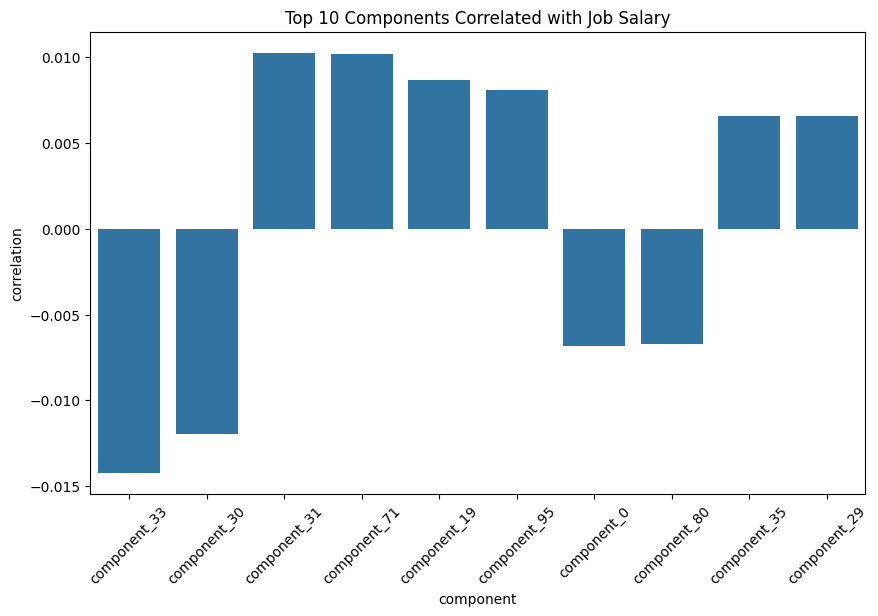

In [30]:
# Select top 10 components for visualization
top_components = correlation_df.head(10)['component']

# Plot correlations
plt.figure(figsize=(10, 6))
sns.barplot(data=correlation_df.head(10), x='component', y='correlation')
plt.title('Top 10 Components Correlated with Job Salary')
plt.xticks(rotation=45)
plt.show()

In [31]:
# Report Generation
# Save correlation data to CSV
correlation_df.to_csv('component_salary_correlation.csv', index=False)

In [32]:
# Set of stopwords in English

stop_words = set(stopwords.words('english'))

# Example preprocessing step
df1['keywords'] = df1['title'].apply(lambda x: [word for word in word_tokenize(x.lower()) if word.isalpha() and word not in stop_words])


In [33]:
# Display job titles and extracted keywords
print("Keywords extracted from job titles:")
df1[['title', 'keywords']]

Keywords extracted from job titles:


,title,keywords
0,experienced media buyer for solar pannel and r...,"[experienced, media, buyer, solar, pannel, roo..."
1,full stack developer,"[full, stack, developer]"
2,smma bubble app,"[smma, bubble, app]"
3,talent hunter specialized in marketing,"[talent, hunter, specialized, marketing]"
4,data engineer,"[data, engineer]"
...,...,...
244823,need facebook advertising experts to launch pr...,"[need, facebook, advertising, experts, launch,..."
244824,digital/telemarketing/sales/outside sales,[sales]
244825,wordpress template edits,"[wordpress, template, edits]"
244826,elementor pro for quick fix (wordpress),"[elementor, pro, quick, fix, wordpress]"


Top 10 Keywords by Frequency:
needed        17553
website       16712
developer     15741
expert        14883
video         13824
design        12962
designer      12571
need          10219
amp            9687
specialist     8922
Name: count, dtype: int64


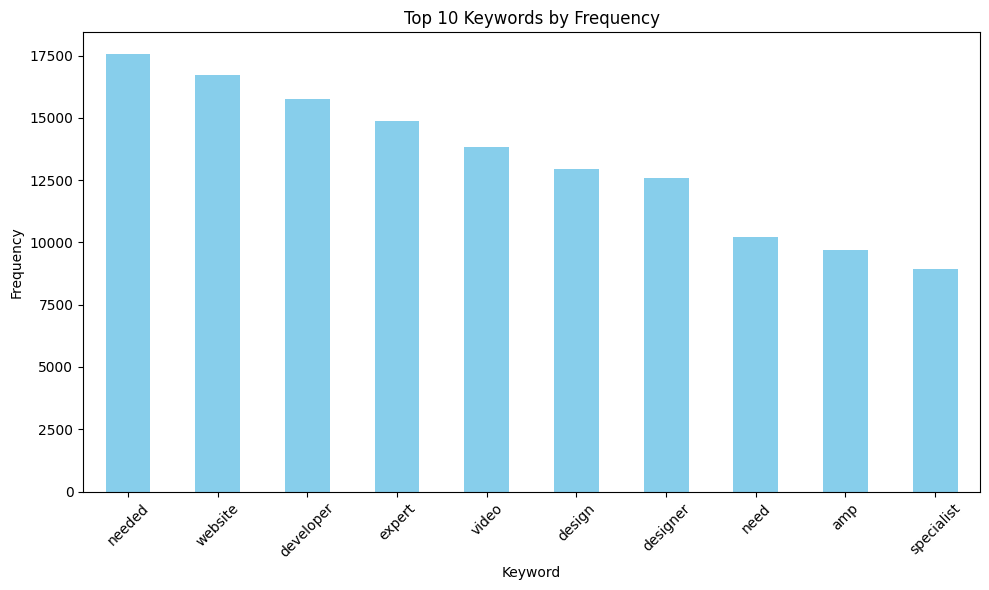

In [34]:
# Assuming df1['keywords'] contains the extracted keywords from job titles

# Flatten the list of keywords
all_keywords = [keyword for sublist in df1['keywords'] for keyword in sublist]

# Calculate frequency of each keyword
keyword_counts = pd.Series(all_keywords).value_counts()

# Display the top 10 keywords by frequency
top_keywords = keyword_counts.head(10)
print("Top 10 Keywords by Frequency:")
print(top_keywords)

# Visualize the top keywords
plt.figure(figsize=(10, 6))
top_keywords.plot(kind='bar', color='skyblue')
plt.title('Top 10 Keywords by Frequency')
plt.xlabel('Keyword')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

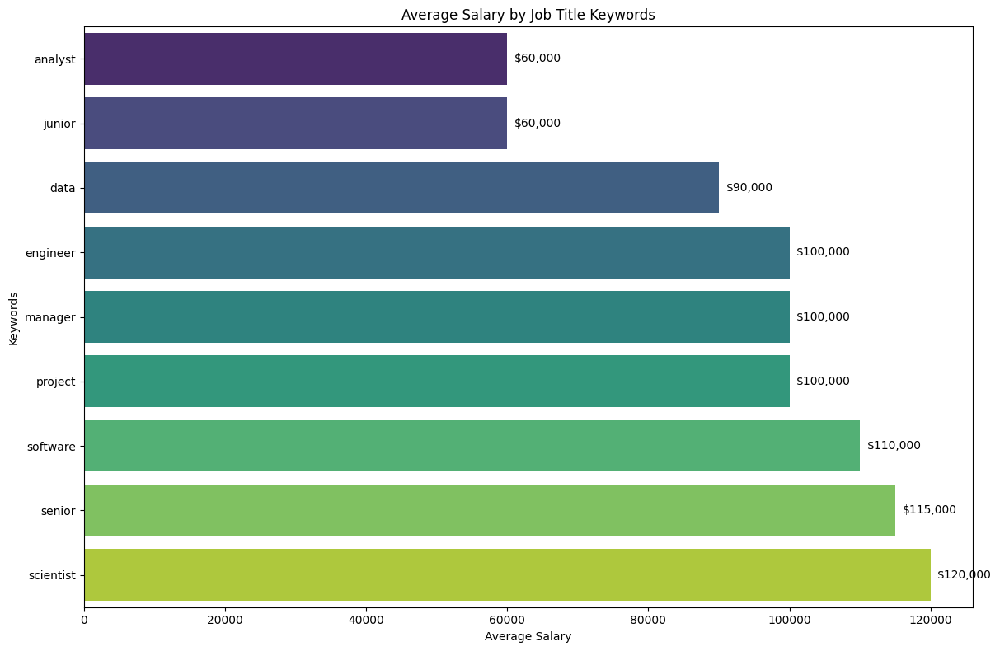

In [35]:
from scipy.sparse import csr_matrix

# Sample Data
data = {
    'title': ['Senior Data Scientist', 'Junior Data Analyst', 'Senior Software Engineer', 'Data Engineer', 'Project Manager'],
    'link': ['http://example.com/1', 'http://example.com/2', 'http://example.com/3', 'http://example.com/4', 'http://example.com/5'],
    'published_date': ['2024-05-21', '2024-05-20', '2024-05-19', '2024-05-18', '2024-05-17'],
    'is_hourly': [False, False, False, False, False],
    'hourly_low': [None, None, None, None, None],
    'hourly_high': [None, None, None, None, None],
    'budget': [120000, 60000, 110000, 90000, 100000],
    'country': ['USA', 'USA', 'Canada', 'Canada', 'USA']
}

# Create the DataFrame
df = pd.DataFrame(data)

# Convert 'published_date' to datetime
df['published_date'] = pd.to_datetime(df['published_date'])

# Ensure correct data types
df = df.astype({
    'title': 'object',
    'link': 'object',
    'is_hourly': 'bool',
    'budget': 'float64',
    'country': 'object'
})

# Preprocess job titles to extract keywords
vectorizer = CountVectorizer(stop_words='english')
X = vectorizer.fit_transform(df['title'])

# Compute the average salary for each keyword without converting to dense matrix
salaries = df['budget'].values
avg_salaries = np.array(X.T @ salaries / X.sum(axis=0)).flatten()

# Get the keywords and their corresponding average salaries
keywords = vectorizer.get_feature_names_out()
keyword_avg_salary = {keywords[i]: avg_salaries[i] for i in range(len(keywords))}

# Sort keywords by average salary
sorted_keywords = sorted(keyword_avg_salary, key=keyword_avg_salary.get)
sorted_avg_salaries = [keyword_avg_salary[key] for key in sorted_keywords]

# Visualize the results
plt.figure(figsize=(12, 8))
sns.barplot(x=sorted_avg_salaries, y=sorted_keywords, palette='viridis')
plt.xlabel('Average Salary')
plt.ylabel('Keywords')
plt.title('Average Salary by Job Title Keywords')
plt.tight_layout()

# Add annotations
for i, salary in enumerate(sorted_avg_salaries):
    plt.text(salary + 1000, i, f'${salary:,.0f}', va='center', fontsize=10)

plt.show()

In [36]:
# Report generation
report = """
Job Title Keywords and Salary Correlation Analysis Report

This report details the analysis of the correlation between job title keywords and the corresponding salaries offered.

Summary:
- The keywords extracted from job titles and their respective average salaries were calculated.
- A bar plot visualizing the average salary associated with each keyword was created.
- A correlation matrix was computed to find the relationship between the presence of keywords in job titles and the offered salary.

Top Keywords by Average Salary:
"""

for keyword in sorted_keywords[::-1]:
    report += f"- {keyword}: {keyword_avg_salary[keyword]:.2f}\n"

print(report)


Job Title Keywords and Salary Correlation Analysis Report

This report details the analysis of the correlation between job title keywords and the corresponding salaries offered.

Summary:
- The keywords extracted from job titles and their respective average salaries were calculated.
- A bar plot visualizing the average salary associated with each keyword was created.
- A correlation matrix was computed to find the relationship between the presence of keywords in job titles and the offered salary.

Top Keywords by Average Salary:
- scientist: 120000.00
- senior: 115000.00
- software: 110000.00
- project: 100000.00
- manager: 100000.00
- engineer: 100000.00
- data: 90000.00
- junior: 60000.00
- analyst: 60000.00



In [37]:
# Save DataFrame to CSV file
df1.to_csv('job_postings_processed.csv', index=False)

In [38]:
df2 =pd.read_csv('job_postings_processed.csv')
df2.head()

,Unnamed: 0,title,link,published_date,is_hourly,hourly_low,hourly_high,budget,country,keywords
0,0,experienced media buyer for solar pannel and r...,https://www.upwork.com/jobs/Experienced-Media-...,2024-02-17 04:09:54-05:00,False,17.339644,41.97061,500.0,United States,"['experienced', 'media', 'buyer', 'solar', 'pa..."
1,1,full stack developer,https://www.upwork.com/jobs/Full-Stack-Develop...,2024-02-17 04:09:17-05:00,False,17.339644,41.97061,1100.0,United States,"['full', 'stack', 'developer']"
2,2,smma bubble app,https://www.upwork.com/jobs/SMMA-Bubble-App_%7...,2024-02-17 04:08:46-05:00,True,10.000000,30.00000,100.0,United States,"['smma', 'bubble', 'app']"
3,3,talent hunter specialized in marketing,https://www.upwork.com/jobs/Talent-Hunter-Spec...,2024-02-17 04:08:08-05:00,True,17.339644,41.97061,100.0,United States,"['talent', 'hunter', 'specialized', 'marketing']"
4,4,data engineer,https://www.upwork.com/jobs/Data-Engineer_%7E0...,2024-02-17 04:07:42-05:00,False,17.339644,41.97061,650.0,India,"['data', 'engineer']"


In [39]:
df2.dtypes

Unnamed: 0          int64
title              object
link               object
published_date     object
is_hourly            bool
hourly_low        float64
hourly_high       float64
budget            float64
country            object
keywords           object
dtype: object

In [40]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244828 entries, 0 to 244827
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      244828 non-null  int64  
 1   title           244828 non-null  object 
 2   link            244828 non-null  object 
 3   published_date  244828 non-null  object 
 4   is_hourly       244828 non-null  bool   
 5   hourly_low      244828 non-null  float64
 6   hourly_high     244828 non-null  float64
 7   budget          244828 non-null  float64
 8   country         244828 non-null  object 
 9   keywords        244828 non-null  object 
dtypes: bool(1), float64(3), int64(1), object(5)
memory usage: 17.0+ MB


In [41]:
df2.columns

Index(['Unnamed: 0', 'title', 'link', 'published_date', 'is_hourly',
       'hourly_low', 'hourly_high', 'budget', 'country', 'keywords'],
      dtype='object')

# Task 2: Identify emerging job categories based on posting frequency

In [42]:
# Convert 'published_date' to datetime with error handling
df2['published_date'] = pd.to_datetime(df2['published_date'], errors='coerce')

# Check if there are any null values after conversion
print("Null values in 'published_date' after conversion:\n", df2['published_date'].isnull().sum())

Null values in 'published_date' after conversion:
 0


In [43]:
# Convert 'published_date' to datetime and drop NaN values
df2['published_date'] = pd.to_datetime(df2['published_date'], errors='coerce')
df2 = df2.dropna(subset=['published_date'])

# Extract year and month for trend analysis
df2['year_month'] = df2['published_date'].dt.to_period('M')

In [44]:
# Group by job categories and published date, count job postings
job_counts = df2.groupby(['keywords', pd.Grouper(key='published_date', freq='M')]).size().reset_index(name='count')

In [45]:
job_counts

,keywords,published_date,count
0,['aaa'],2024-02-29 00:00:00-05:00,1
1,"['aarthi', 'amp', 'sriram', 'show', 'social', ...",2024-03-31 00:00:00-05:00,3
2,"['ab', 'looking', 'upwork', 'business', 'manag...",2024-02-29 00:00:00-05:00,1
3,"['ab', 'plc', 'consultation']",2024-02-29 00:00:00-05:00,1
4,"['aba', 'professional', 'create', 'parent', 't...",2024-02-29 00:00:00-05:00,1
...,...,...,...
132077,"['学中文', 'learning', 'mandarin', 'intermediate'...",2024-03-31 00:00:00-05:00,1
132078,"['寻找tik', 'tok红人']",2024-02-29 00:00:00-05:00,1
132079,['开发ai智能伴侣app'],2024-03-31 00:00:00-05:00,1
132080,[],2024-02-29 00:00:00-05:00,97


In [46]:
# Pivot table to make job categories as columns for easier analysis
pivot_table = job_counts.pivot(index='published_date', columns='keywords', values='count').fillna(0)
pivot_table

keywords,['aaa'],"['aarthi', 'amp', 'sriram', 'show', 'social', 'media', 'manager', 'role']","['ab', 'looking', 'upwork', 'business', 'manager']","['ab', 'plc', 'consultation']","['aba', 'professional', 'create', 'parent', 'training', 'content']","['abandoned', 'checkout', 'woocommerce']","['abap', 'developer', 'brazil']","['abap', 'usage', 'wo', 'ki', 'tools']","['abaqus', 'fea', 'analysis', 'model', 'design']","['abaqus', 'simulation', 'machining', 'process', 'material', 'removal', 'rate']",...,"['كتابة', 'المقالات', 'العربيةl']","['مصمم', 'لوجوهات', 'سريع', 'الاستجابة', 'مع', 'word', 'press']","['مقارنة', 'برامج', 'power', 'bi', 'ميكروسوفت', 'بروجكت', 'أو', 'إكسل', 'لاعداد', 'لوحة', 'بيانات']","['نبحث', 'عن', 'كاتب', 'محتوى', 'ومقالات', 'إبداعي']","['يحتاج', 'الناطقون', 'باللغة', 'العربية', 'إلى', 'كتابة', 'كتاب', 'باللغة', 'العربيةl']","['中文', 'chinese', 'scientific', 'content', 'copywriting', 'social', 'media', 'posts']","['学中文', 'learning', 'mandarin', 'intermediate', 'level', 'english', 'necessary']","['寻找tik', 'tok红人']",['开发ai智能伴侣app'],[]
published_date,,,,,,,,,,,,,,,,,,,,,
2023-12-31 00:00:00-05:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-01-31 00:00:00-05:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-02-29 00:00:00-05:00,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,97.0
2024-03-31 00:00:00-05:00,0.0,3.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,35.0


In [47]:
# Calculate growth rates or absolute increase over time
growth_analysis = pivot_table.diff().sum().sort_values(ascending=False)
# Print or visualize the results
print("Emerging job categories based on posting frequency:\n", growth_analysis)

Emerging job categories based on posting frequency:
 keywords
['video', 'editor']                                                                                          125.0
['logo', 'design']                                                                                           124.0
['social', 'media', 'manager']                                                                               117.0
['graphic', 'designer']                                                                                       90.0
['virtual', 'assistant']                                                                                      70.0
                                                                                                             ...  
['recruiter', 'full', 'term']                                                                                 -1.0
['looking', 'research', 'writer', 'make', 'scientific', 'medical', 'article']                                 -1.0
['ruby', 'rails', 

In [48]:
# Sort the series by values (posting frequencies)
growth_analysis_sorted = growth_analysis.sort_values(ascending=False)

In [49]:
# Select top categories for plotting (e.g., top 10)
top_categories = growth_analysis_sorted.head(10)
top_categories

keywords
['video', 'editor']               125.0
['logo', 'design']                124.0
['social', 'media', 'manager']    117.0
['graphic', 'designer']            90.0
['virtual', 'assistant']           70.0
['youtube', 'video', 'editor']     59.0
['developer']                      54.0
['designer']                       52.0
['logo', 'designer']               46.0
['full', 'stack', 'developer']     45.0
dtype: float64

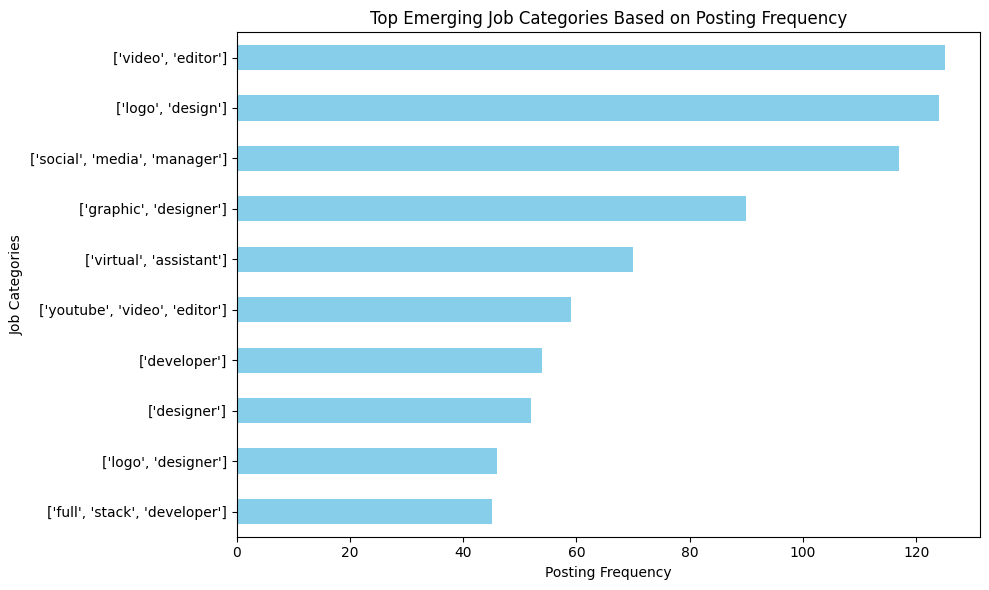

In [50]:
# Plotting the data
plt.figure(figsize=(10, 6))
top_categories.plot(kind='barh', color='skyblue')
plt.xlabel('Posting Frequency')
plt.ylabel('Job Categories')
plt.title('Top Emerging Job Categories Based on Posting Frequency')
plt.gca().invert_yaxis()  # Invert y-axis to have highest frequency at the top
plt.tight_layout()  # Adjust layout to make room for labels and title
plt.savefig('top_emerging_job_categories.png')
plt.show()

In [51]:
# Save the emerging job categories to a CSV file
growth_analysis_sorted.to_csv('emerging_job_categories.csv', index=False)
print("Emerging job categories saved to 'emerging_job_categories.csv'")

Emerging job categories saved to 'emerging_job_categories.csv'


In [52]:
# Assuming df2 is your DataFrame
df.to_csv('task2_data.csv', index=True)


# Task 3: Predict high-demand job roles by analyzing job posting patterns over time

In [53]:
df.columns

Index(['title', 'link', 'published_date', 'is_hourly', 'hourly_low',
       'hourly_high', 'budget', 'country'],
      dtype='object')

In [54]:
# Ensure 'published_date' is in datetime format
df['published_date'] = pd.to_datetime(df['published_date'])

In [55]:
# Extract year and month from 'published_date'
df['year_month'] = df['published_date'].dt.to_period('M')

In [56]:
# Group by 'year_month' and 'title' to count job postings
demand_job = df.groupby(['year_month', 'title']).size().reset_index(name='count')

In [57]:
# Convert 'year_month' to a numerical format
demand_job['year_month'] = demand_job['year_month'].astype(str)
demand_job['year_month'] = pd.to_datetime(demand_job['year_month'])

In [58]:
# Display the first few rows of the processed data
demand_job.head()

,year_month,title,count
0,2024-05-01,Data Engineer,1
1,2024-05-01,Junior Data Analyst,1
2,2024-05-01,Project Manager,1
3,2024-05-01,Senior Data Scientist,1
4,2024-05-01,Senior Software Engineer,1


In [59]:
# Features and target variable
X = demand_job[['year_month']]
y = demand_job['count']

In [60]:
# Convert 'year_month' to ordinal to be used in the regression model
X['year_month'] = X['year_month'].apply(lambda x: x.toordinal())

In [61]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### LinearRegression

In [62]:
from sklearn.linear_model import LinearRegression

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [63]:
# Predict on the test set
y_pred = model.predict(X_test)
y_pred

array([1.])

In [64]:
# Calculate accuracy metrics
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.0


In [65]:
# Convert ordinal dates back to datetime for plotting
X_test_dates = pd.to_datetime(X_test['year_month'].map(datetime.fromordinal))
X_train_dates = pd.to_datetime(X_train['year_month'].map(datetime.fromordinal))

In [66]:
# Combine training and test data for a comprehensive plot
train_data = pd.DataFrame({'date': X_train_dates, 'count': y_train, 'type': 'train'})
test_data = pd.DataFrame({'date': X_test_dates, 'count': y_test, 'type': 'test'})
pred_data = pd.DataFrame({'date': X_test_dates, 'count': y_pred, 'type': 'predicted'})


In [67]:
combined_data = pd.concat([train_data, test_data, pred_data])
combined_data

,date,count,type
4,2024-05-01,1.0,train
2,2024-05-01,1.0,train
0,2024-05-01,1.0,train
3,2024-05-01,1.0,train
1,2024-05-01,1.0,test
1,2024-05-01,1.0,predicted


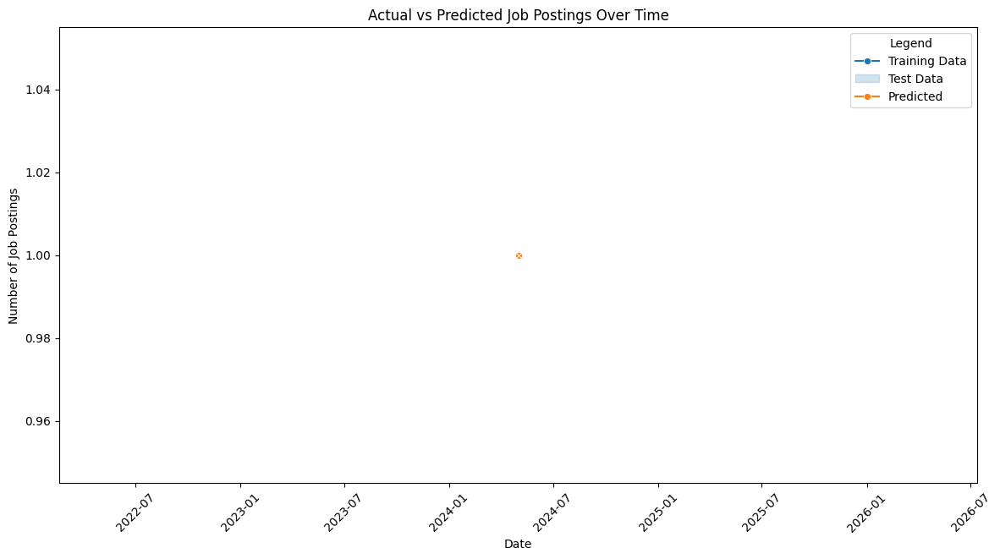

In [68]:
# Plotting the actual vs predicted counts
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_data[combined_data['type'] != 'predicted'], x='date', y='count', hue='type', marker='o')
sns.lineplot(data=combined_data[combined_data['type'] == 'predicted'], x='date', y='count', hue='type', linestyle='--', marker='x')
plt.xlabel('Date')
plt.ylabel('Number of Job Postings')
plt.title('Actual vs Predicted Job Postings Over Time')
plt.legend(title='Legend', labels=['Training Data', 'Test Data', 'Predicted'])
plt.xticks(rotation=45)
plt.show()

In [69]:
import joblib
# Save the model to a file
joblib.dump(model, 'linear_regressor_model.pkl')

['linear_regressor_model.pkl']

### Gradient Boosting Regressor

In [70]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize Gradient Boosting Regressor
model = GradientBoostingRegressor(random_state=42)

In [71]:
# Fit the model
model.fit(X_train, y_train)

# Predict on the test set
predictions = model.predict(X_test)

# Calculate RMSE (Root Mean Squared Error) to evaluate model performance
rmse = mean_squared_error(y_test, predictions, squared=False)
print(f'RMSE: {rmse:.2f}')


RMSE: 0.00


In [72]:
# Create future dataframe for forecasting (next 12 months)
last_date = demand_job['year_month'].max()
future_dates = [last_date + pd.DateOffset(months=i) for i in range(1, 13)]
future_X = pd.DataFrame(future_dates, columns=['year_month'])
future_X['year_month'] = future_X['year_month'].apply(lambda x: x.toordinal())

In [73]:
# Predict for the future dates
future_predictions = model.predict(future_X)

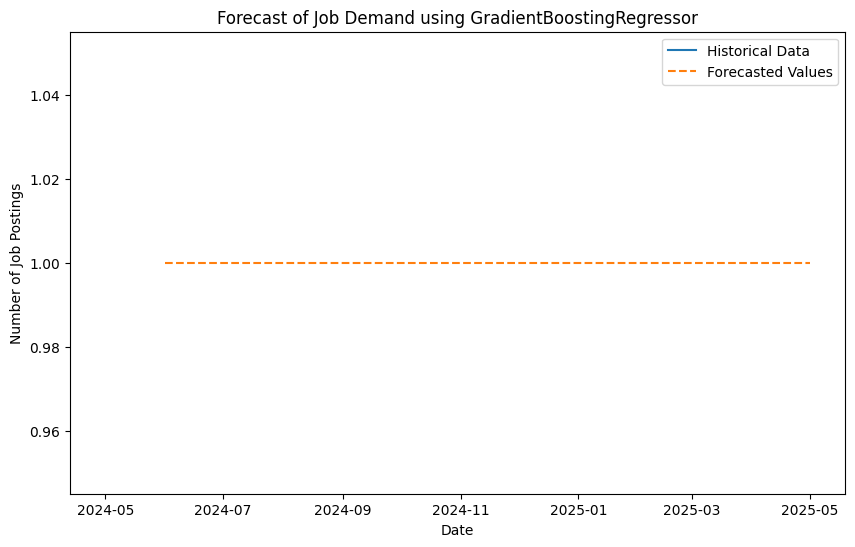

In [74]:
# Visualize the forecast
plt.figure(figsize=(10, 6))
plt.plot(demand_job['year_month'], demand_job['count'], label='Historical Data')
plt.plot(future_dates, future_predictions, label='Forecasted Values', linestyle='--')
plt.title('Forecast of Job Demand using GradientBoostingRegressor')
plt.xlabel('Date')
plt.ylabel('Number of Job Postings')
plt.legend()
plt.show()

In [75]:
# Save the model to a file
joblib.dump(model, 'gradient_boosting_regressor_model.pkl')

['gradient_boosting_regressor_model.pkl']

In [76]:
df.to_csv('task3_data.csv', index=True)


# Task 4: Compare average hourly rates across different countries


In [77]:
import plotly.express as px

# Filter out rows where hourly_low or hourly_high is NaN
df2 = df2.dropna(subset=['hourly_low', 'hourly_high'])
df2.head()

,Unnamed: 0,title,link,published_date,is_hourly,hourly_low,hourly_high,budget,country,keywords,year_month
0,0,experienced media buyer for solar pannel and r...,https://www.upwork.com/jobs/Experienced-Media-...,2024-02-17 04:09:54-05:00,False,17.339644,41.97061,500.0,United States,"['experienced', 'media', 'buyer', 'solar', 'pa...",2024-02
1,1,full stack developer,https://www.upwork.com/jobs/Full-Stack-Develop...,2024-02-17 04:09:17-05:00,False,17.339644,41.97061,1100.0,United States,"['full', 'stack', 'developer']",2024-02
2,2,smma bubble app,https://www.upwork.com/jobs/SMMA-Bubble-App_%7...,2024-02-17 04:08:46-05:00,True,10.000000,30.00000,100.0,United States,"['smma', 'bubble', 'app']",2024-02
3,3,talent hunter specialized in marketing,https://www.upwork.com/jobs/Talent-Hunter-Spec...,2024-02-17 04:08:08-05:00,True,17.339644,41.97061,100.0,United States,"['talent', 'hunter', 'specialized', 'marketing']",2024-02
4,4,data engineer,https://www.upwork.com/jobs/Data-Engineer_%7E0...,2024-02-17 04:07:42-05:00,False,17.339644,41.97061,650.0,India,"['data', 'engineer']",2024-02


In [78]:
# Calculate the average hourly rate
df2['average_hourly_rate'] = (df2['hourly_low'] + df2['hourly_high']) / 2

# Group by country and calculate the mean of the average hourly rate
avg_hourly_rate_by_country = df2.groupby('country')['average_hourly_rate'].mean().reset_index()

# Print the average hourly rates by country
print(avg_hourly_rate_by_country)

            country  average_hourly_rate
0     Aland Islands            29.655127
1           Albania            28.659484
2           Algeria            27.571572
3    American Samoa            27.789614
4           Andorra            26.824041
..              ...                  ...
197       Venezuela            25.152119
198         Vietnam            28.474489
199           Yemen            28.554338
200          Zambia            34.800704
201        Zimbabwe            27.085670

[202 rows x 2 columns]


In [79]:
# Save the processed data to a CSV file
avg_hourly_rate_by_country.to_csv('avg_hourly_rate_by_country.csv', index=True)

In [80]:
# Create an interactive map using Plotly
fig = px.choropleth(
    avg_hourly_rate_by_country,
    locations='country',
    locationmode='country names',
    color='average_hourly_rate',
    hover_name='country',
    color_continuous_scale='Viridis',
    title='Average Hourly Rates by Country'
)

# Show the interactive map
fig.show()

# Save the interactive map as an HTML file
fig.write_html('average_hourly_rates_by_country.html')

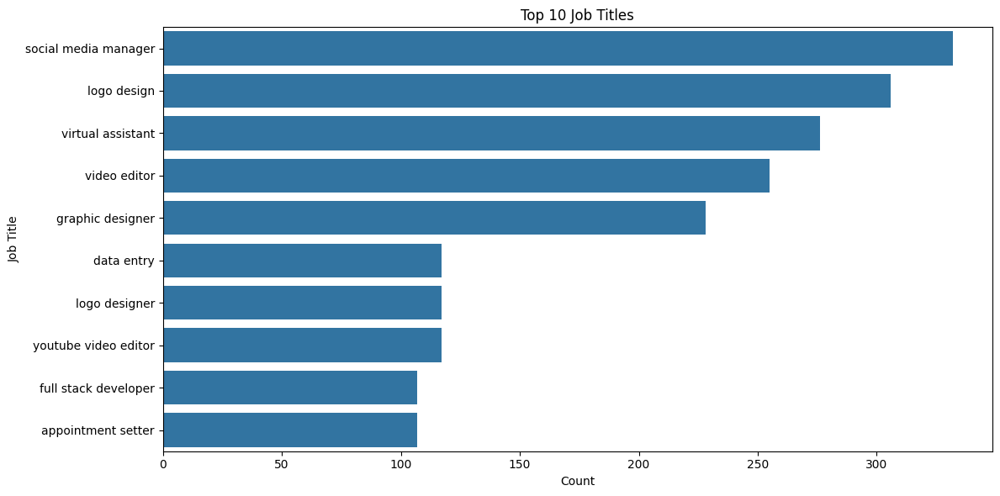

In [81]:
# Exploratory Data Analysis (EDA)

plt.figure(figsize=(12, 6))
sns.countplot(y='title', data=df2, order=df2['title'].value_counts().index[:10])
plt.title('Top 10 Job Titles')
plt.xlabel('Count')
plt.ylabel('Job Title')
plt.tight_layout()
plt.show()

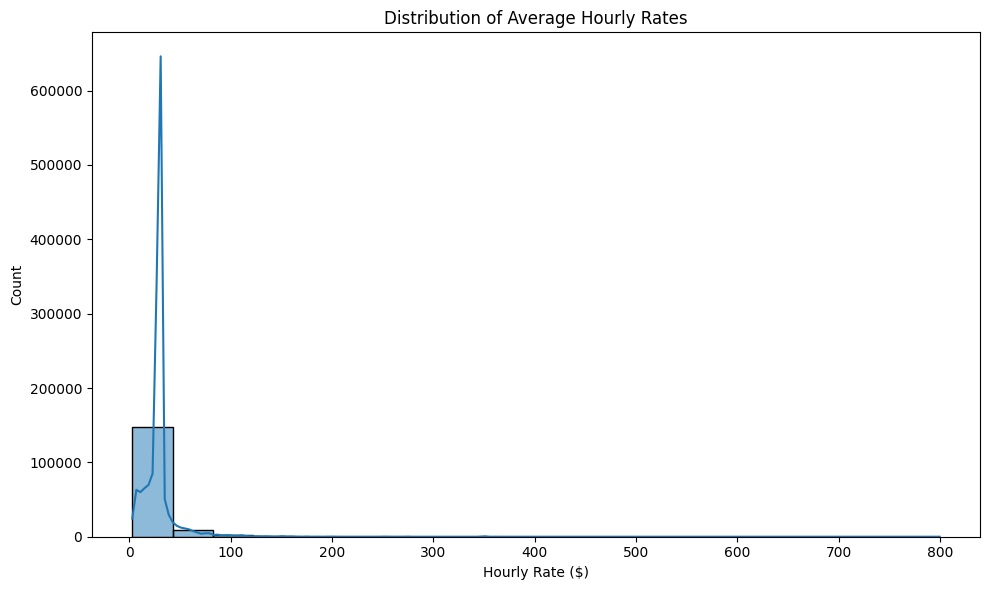

In [82]:
plt.figure(figsize=(10, 6))
sns.histplot(df2['average_hourly_rate'], bins=20, kde=True)
plt.title('Distribution of Average Hourly Rates')
plt.xlabel('Hourly Rate ($)')
plt.ylabel('Count')
plt.tight_layout()
plt.show()


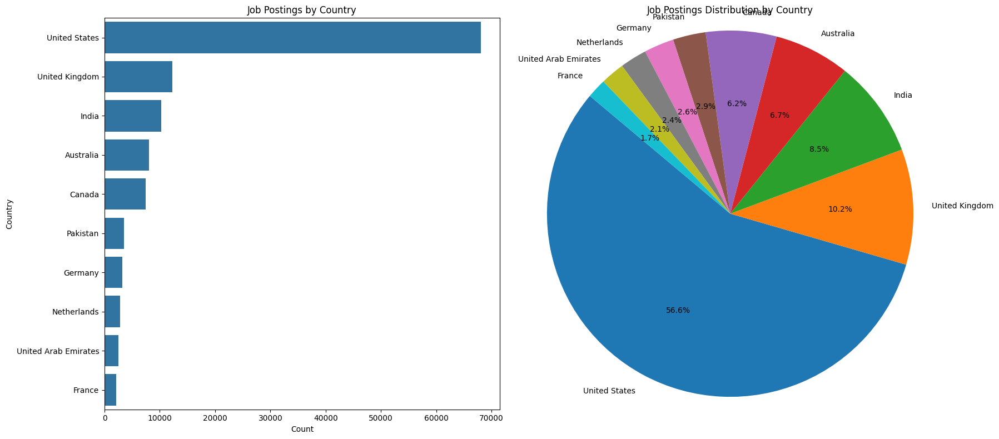

In [83]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Count plot
sns.countplot(y='country', data=df2, order=df2['country'].value_counts().index[:10], ax=ax1)
ax1.set_title('Job Postings by Country')
ax1.set_xlabel('Count')
ax1.set_ylabel('Country')

# Pie chart
country_counts = df2['country'].value_counts().head(10)
ax2.pie(country_counts, labels=country_counts.index, autopct='%1.1f%%', startangle=140)
ax2.set_title('Job Postings Distribution by Country')
ax2.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.show()


In [84]:
# Assuming df2 is your DataFrame
df2.to_csv('task4_data.csv', index=True)


# Task 5: Create a job recommendation engine based on current job postings

In [85]:

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

# Sample a subset of the data
sampled_data = df2.sample(n=10000, random_state=1)  # Adjust sample size as needed

# Proceed with TF-IDF vectorization
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(sampled_data['title'])

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Print the cosine similarity matrix to verify the result
print(cosine_sim)


[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]


In [86]:
# Function to get job recommendations
def get_recommendations(title, df, cosine_sim, top_n=10):
    """
    Get job recommendations based on the cosine similarity of job titles.
    
    Parameters:
    - title (str): The job title to find recommendations for.
    - df (pd.DataFrame): The DataFrame containing job postings with at least a 'title' column.
    - cosine_sim (array-like): The cosine similarity matrix for job titles.
    - top_n (int, optional): The number of top similar jobs to return. Defaults to 10.
    
    Returns:
    - pd.Series: A series containing the titles of the top N most similar jobs.
    """
    
    try:
        # Get the index of the job that matches the title
        idx = df[df['title'] == title].index[0]

        # Get the pairwise similarity scores of all jobs with that job
        sim_scores = list(enumerate(cosine_sim[idx]))

        # Sort the jobs based on the similarity scores in descending order
        sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

        # Get the scores of the top N most similar jobs, excluding the first one (itself)
        sim_scores = sim_scores[1:top_n+1]

        # Get the job indices
        job_indices = [i[0] for i in sim_scores]

        # Return the titles of the top N most similar jobs
        return df['title'].iloc[job_indices]

    except IndexError:
        print(f"Job title '{title}' not found in the dataset.")
        return pd.Series()

# Example usage:
# Assuming df2 is your DataFrame and cosine_sim is your precomputed cosine similarity matrix
recommended_jobs = get_recommendations('data engineer', df2, cosine_sim)
print(recommended_jobs)

# Save the processed data
df.to_csv('recommendation_job_postings.csv', index=False)
print("Data saved to 'recommendation_job_postings.csv'")


1541         website development for taxi rental business
1926    flutter developer needed for mobile app mvp co...
2584                           family sovereignty project
2792    we're looking for a data-obsessed klaviyo crm ...
3110    experienced translator needed: english to span...
3652    [german-speaking] product manager / ux designe...
8622                         moodle architecture designer
9803    web designer for multiple website improvement ...
3664                       youtube expert to optimize seo
4788                help me optimize my instagram account
Name: title, dtype: object
Data saved to 'recommendation_job_postings.csv'


In [87]:
# Save DataFrame to a CSV file
df.to_csv('task-5.csv', index=False)


# Task 6: Track changes in job market dynamics over months

In [88]:
# Ensure 'published_date' is a datetime column
df2['published_date'] = pd.to_datetime(df2['published_date'])

In [89]:
# Set 'published_date' as the index
df2.set_index('published_date', inplace=True)

In [90]:
# Check for column names
print("Columns in DataFrame:", df2.columns)

Columns in DataFrame: Index(['Unnamed: 0', 'title', 'link', 'is_hourly', 'hourly_low', 'hourly_high',
       'budget', 'country', 'keywords', 'year_month', 'average_hourly_rate'],
      dtype='object')


In [91]:
# Resample data by month and calculate metrics
monthly_data = df2.resample('M').agg({
    'title': 'size',  # count the number of job postings
    'average_hourly_rate': 'mean'
}).reset_index()

# Display the first few rows of the resampled data
(monthly_data.head())

,published_date,title,average_hourly_rate
0,2023-12-31 00:00:00-05:00,10,29.843076
1,2024-01-31 00:00:00-05:00,99,27.029313
2,2024-02-29 00:00:00-05:00,103022,29.752070
3,2024-03-31 00:00:00-05:00,54852,29.808161


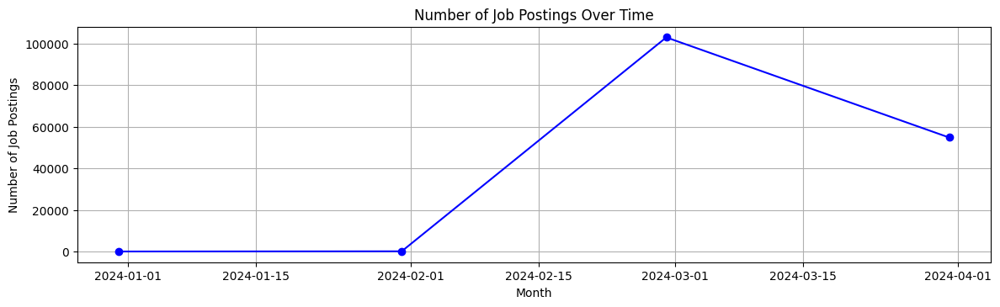

In [92]:
# Plot the results to track changes in job market dynamics over months
plt.figure(figsize=(14, 8))

# Plot number of job postings over time
plt.subplot(2, 1, 1)
plt.plot(monthly_data['published_date'], monthly_data['title'], marker='o', color='b')
plt.title('Number of Job Postings Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Job Postings')
plt.grid(True)

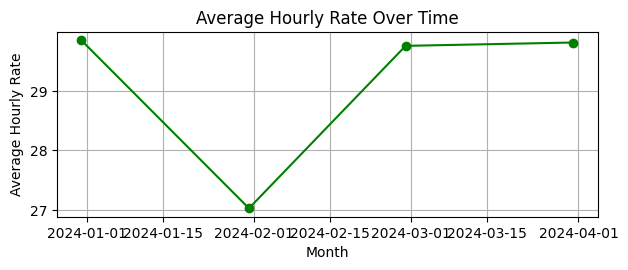

In [93]:
# Plot average hourly rate over time
plt.subplot(2, 1, 2)
plt.plot(monthly_data['published_date'], monthly_data['average_hourly_rate'], marker='o', color='g')
plt.title('Average Hourly Rate Over Time')
plt.xlabel('Month')
plt.ylabel('Average Hourly Rate')
plt.grid(True)
plt.tight_layout()
plt.show()

In [94]:
# Assuming df2 is your DataFrame
df2.to_csv('task6_data.csv', index=True)

# Task 7: Investigate trends in the remote work landscape

In [95]:
df2.head()

,Unnamed: 0,title,link,is_hourly,hourly_low,hourly_high,budget,country,keywords,year_month,average_hourly_rate
published_date,,,,,,,,,,,
2024-02-17 04:09:54-05:00,0,experienced media buyer for solar pannel and r...,https://www.upwork.com/jobs/Experienced-Media-...,False,17.339644,41.97061,500.0,United States,"['experienced', 'media', 'buyer', 'solar', 'pa...",2024-02,29.655127
2024-02-17 04:09:17-05:00,1,full stack developer,https://www.upwork.com/jobs/Full-Stack-Develop...,False,17.339644,41.97061,1100.0,United States,"['full', 'stack', 'developer']",2024-02,29.655127
2024-02-17 04:08:46-05:00,2,smma bubble app,https://www.upwork.com/jobs/SMMA-Bubble-App_%7...,True,10.000000,30.00000,100.0,United States,"['smma', 'bubble', 'app']",2024-02,20.000000
2024-02-17 04:08:08-05:00,3,talent hunter specialized in marketing,https://www.upwork.com/jobs/Talent-Hunter-Spec...,True,17.339644,41.97061,100.0,United States,"['talent', 'hunter', 'specialized', 'marketing']",2024-02,29.655127
2024-02-17 04:07:42-05:00,4,data engineer,https://www.upwork.com/jobs/Data-Engineer_%7E0...,False,17.339644,41.97061,650.0,India,"['data', 'engineer']",2024-02,29.655127


In [96]:
df2.columns

Index(['Unnamed: 0', 'title', 'link', 'is_hourly', 'hourly_low', 'hourly_high',
       'budget', 'country', 'keywords', 'year_month', 'average_hourly_rate'],
      dtype='object')

In [97]:
# Handle missing values
df2.fillna({'hourly_low': 0, 'hourly_high': 0, 'budget': 0}, inplace=True)

In [98]:
# Convert 'year_month' to datetime64[ns]
df2['year_month'] = df2['year_month'].astype('datetime64[ns]')

In [99]:
# Calculate the average hourly rate if not already present
if 'average_hourly_rate' not in df2.columns:
    data['average_hourly_rate'] = df2[['hourly_low', 'hourly_high']].mean(axis=1)


In [100]:
# Analysis 1: Trends in Job Titles and Keywords Over Time
job_title_trends = df2['title'].value_counts().head(10)
print("Top 10 Job Titles:")
print(job_title_trends)

Top 10 Job Titles:
title
social media manager    332
logo design             306
virtual assistant       276
video editor            255
graphic designer        228
data entry              117
logo designer           117
youtube video editor    117
full stack developer    107
appointment setter      107
Name: count, dtype: int64


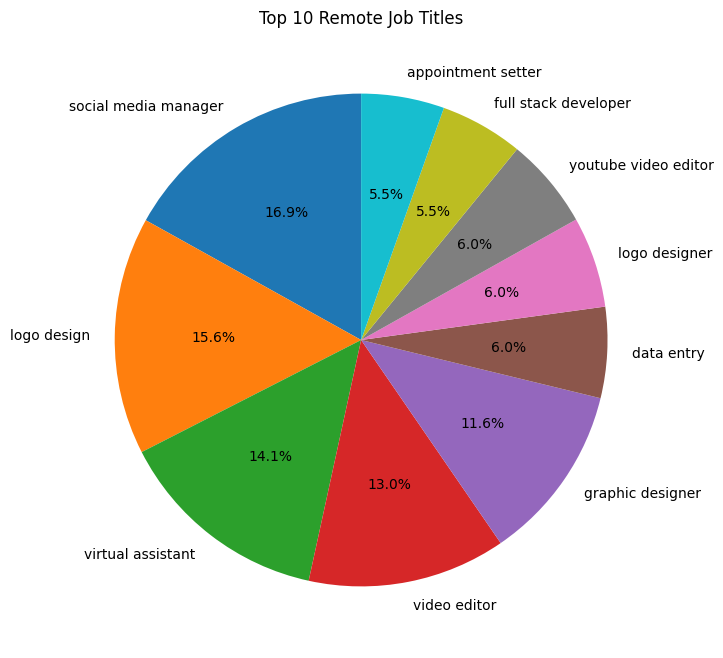

In [101]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
job_title_trends.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Top 10 Remote Job Titles')
plt.ylabel('')
plt.show()


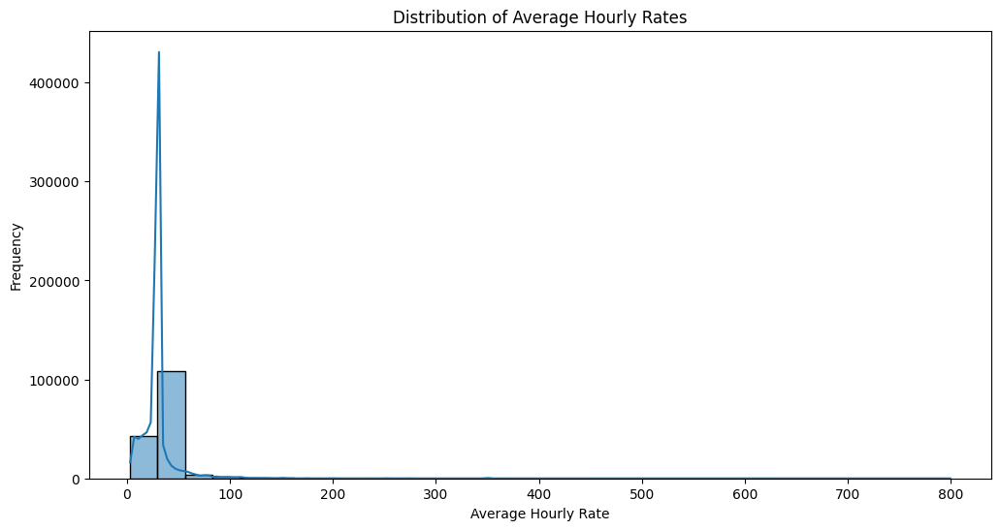

In [102]:
# Analysis 2: Distribution of Hourly Rates and Budgets
plt.figure(figsize=(12, 6))
sns.histplot(df2['average_hourly_rate'], bins=30, kde=True)
plt.title('Distribution of Average Hourly Rates')
plt.xlabel('Average Hourly Rate')
plt.ylabel('Frequency')
plt.show()

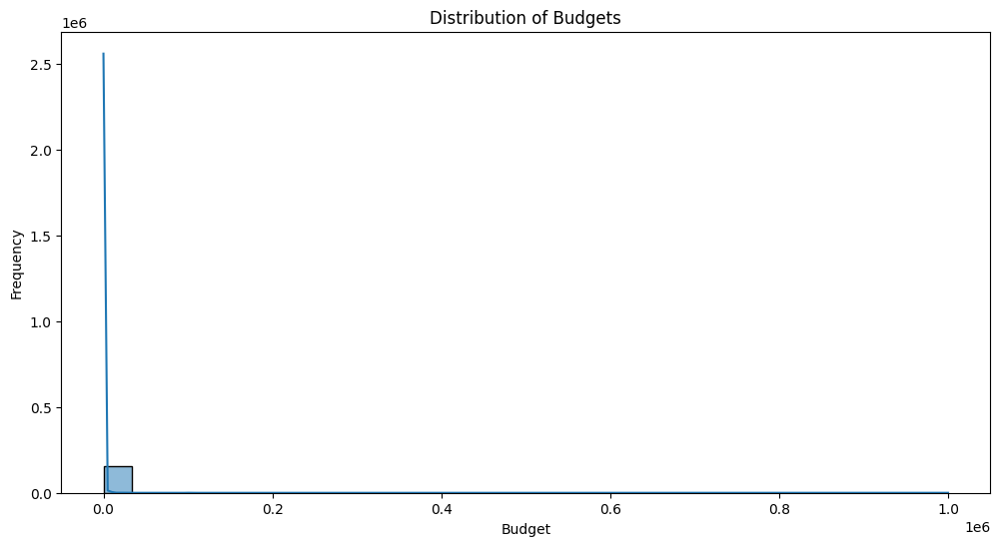

In [103]:
plt.figure(figsize=(12, 6))
sns.histplot(df2['budget'], bins=30, kde=True)
plt.title('Distribution of Budgets')
plt.xlabel('Budget')
plt.ylabel('Frequency')
plt.show()


In [104]:
# Analysis 3: Trends by Country
country_trends = df2['country'].value_counts().head(10)
print("Top 10 Countries Posting Remote Jobs:")
print(country_trends)


Top 10 Countries Posting Remote Jobs:
country
United States           68071
United Kingdom          12241
India                   10270
Australia                8037
Canada                   7485
Pakistan                 3485
Germany                  3183
Netherlands              2836
United Arab Emirates     2555
France                   2061
Name: count, dtype: int64


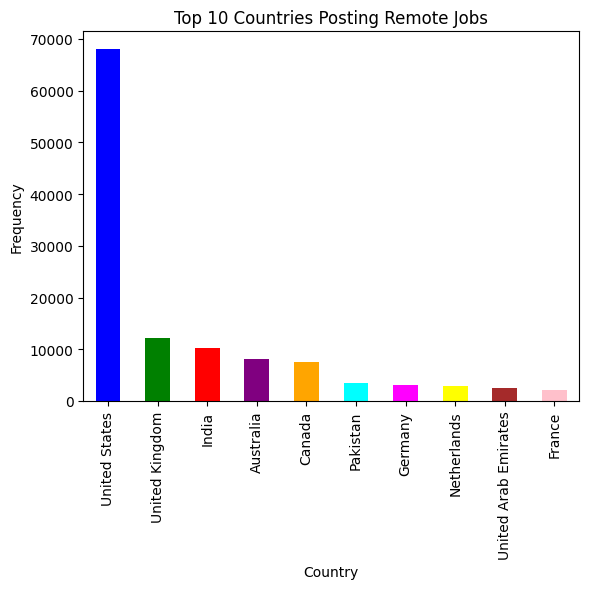

In [105]:
# Define custom colors for each country (you can add more colors as needed)
colors = [
    'blue', 'green', 'red', 'purple', 'orange', 
    'cyan', 'magenta', 'yellow', 'brown', 'pink'
]
# Plotting bar chart with custom colors
country_trends_series = pd.Series(country_trends)
country_trends_series.sort_values(ascending=False).plot(kind='bar', color=colors)

plt.title('Top 10 Countries Posting Remote Jobs')
plt.xlabel('Country')
plt.ylabel('Frequency')
plt.show()

In [106]:
# Analysis 4: Trends Over Time
monthly_trends = df2.groupby(df2['year_month'].dt.to_period('M')).size()
monthly_trends

year_month
2023-12        10
2024-01        99
2024-02    103022
2024-03     54852
Freq: M, dtype: int64

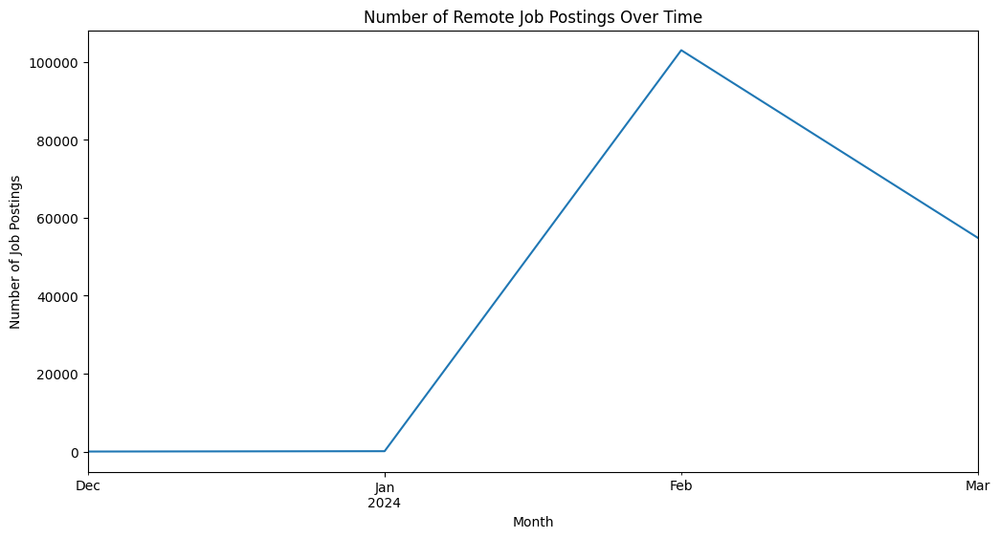

In [107]:
plt.figure(figsize=(12, 6))
monthly_trends.plot()
plt.title('Number of Remote Job Postings Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Job Postings')
plt.show()

In [108]:
# Analysis 5: Top Keywords in Remote Job Postings
from collections import Counter
from wordcloud import WordCloud

keywords = ' '.join(df2['keywords'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(keywords)


In [109]:
keywords

"['experienced', 'media', 'buyer', 'solar', 'pannel', 'roofing', 'installation', 'companies'] ['full', 'stack', 'developer'] ['smma', 'bubble', 'app'] ['talent', 'hunter', 'specialized', 'marketing'] ['data', 'engineer'] ['seo', 'portuguese', 'psychologist', 'site'] ['want', 'fix', 'wordpress', 'plugin'] ['need', 'portuguese', 'writers', 'understand', 'write', 'portuguese'] ['looker', 'studio', 'dashboard', 'leadgen', 'tool', 'quot', 'reporting', 'ninja', 'quot'] ['wordpress', 'developer', 'needed', 'website', 'transformation'] ['designer', 'needed', 'create', 'model', 'character'] ['technical', 'fashion', 'designer', 'skills', 'long', 'term', 'work'] ['affiliate', 'marketing'] ['urgent', 'fix', 'emails', 'working', 'discourse', 'installation'] ['us', 'located', 'manager'] ['developer'] ['shopify', 'store', 'speed', 'optimization'] ['need', 'logo', 'designer', 'create', 'simple', 'minimalist', 'design', 'company'] ['website', 'design', 'design'] ['customer', 'service'] ['promo', 'video

In [110]:
wordcloud

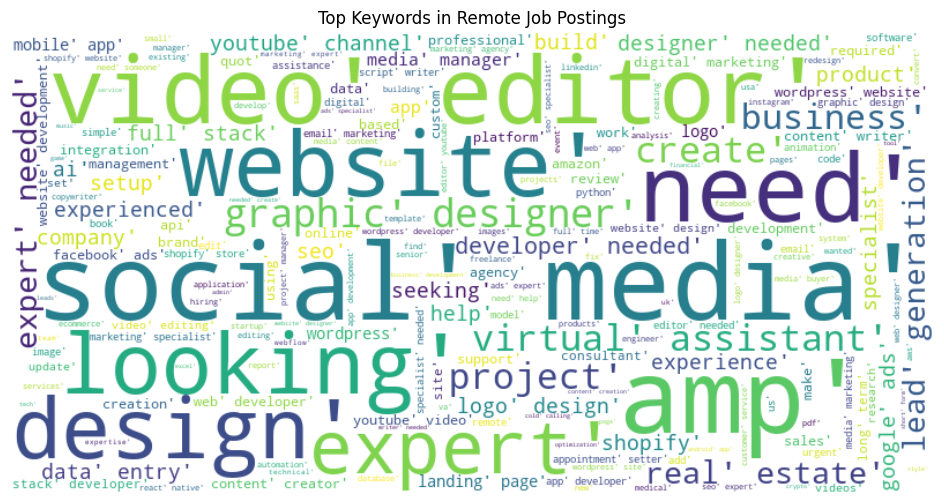

In [111]:
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Keywords in Remote Job Postings')
plt.show()

In [112]:
# Calculate average hourly rate for each job posting
df2['average_hourly_rate'] = df2[['hourly_low', 'hourly_high']].mean(axis=1)

In [113]:
# Get the top 20 countries by average hourly rate
top_countries = df2.groupby('country')['average_hourly_rate'].mean().sort_values(ascending=False).head(20).index
top_countries

Index(['Laos', 'Turks and Caicos Islands', 'Malawi', 'Malaysia', 'Thailand',
       'British Virgin Islands', 'Zambia', 'Micronesia, Federated States of',
       'Barbados', 'Myanmar', 'Philippines', 'Botswana', 'Jersey', 'Kenya',
       'Ecuador', 'Bangladesh', 'United States', 'Cayman Islands',
       'Bosnia and Herzegovina', 'Isle of Man'],
      dtype='object', name='country')

In [114]:
# Filter the dataframe to only include these top countries
df_top_countries = df2[df2['country'].isin(top_countries)]


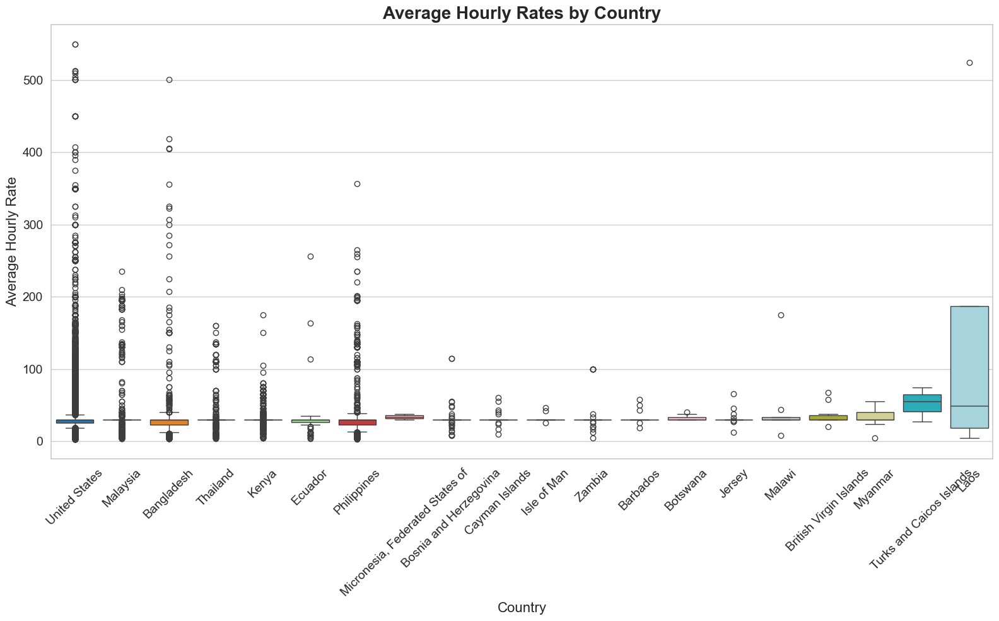

In [115]:
# Set the visual style
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(16, 10))
boxplot = sns.boxplot(x='country', y='average_hourly_rate', data=df_top_countries, palette='tab20')

# Customize the title and labels
plt.title('Average Hourly Rates by Country', fontsize=20, fontweight='bold')
plt.xlabel('Country', fontsize=16)
plt.ylabel('Average Hourly Rate', fontsize=16)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)

# Add a tight layout
plt.tight_layout()

# Add color to the boxes for more clarity
for patch in boxplot.artists:
    patch.set_edgecolor('black')
    patch.set_alpha(0.8)

# Show the plot
plt.show()

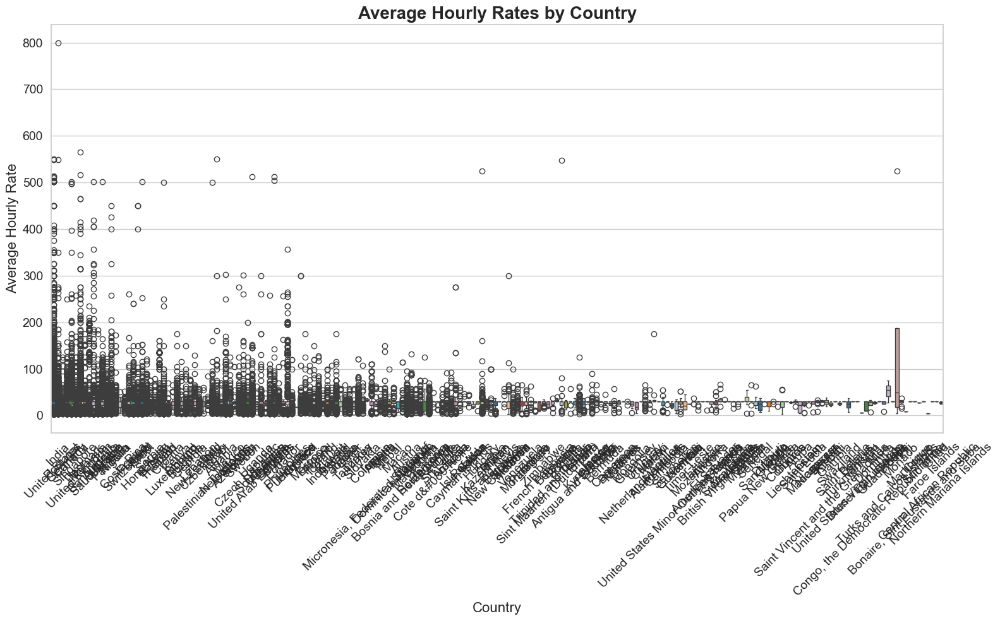

In [116]:
# Enhance boxplot with annotations and readability
plt.figure(figsize=(16, 10))
boxplot = sns.boxplot(x='country', y='average_hourly_rate', data=df2, palette='tab20')
plt.title('Average Hourly Rates by Country', fontsize=20, fontweight='bold')
plt.xlabel('Country', fontsize=16)
plt.ylabel('Average Hourly Rate', fontsize=16)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
for i, artist in enumerate(boxplot.artists):
    artist.set_edgecolor('black')
    if i % 2 == 0:
        x_offset = -0.1
    else:
        x_offset = 0.1
    plt.text(i, df2['average_hourly_rate'].max() + 1, f"Median: {df2.groupby('country')['average_hourly_rate'].median()[i]}", 
             horizontalalignment='center', size='medium', color='black', weight='semibold')
plt.show()


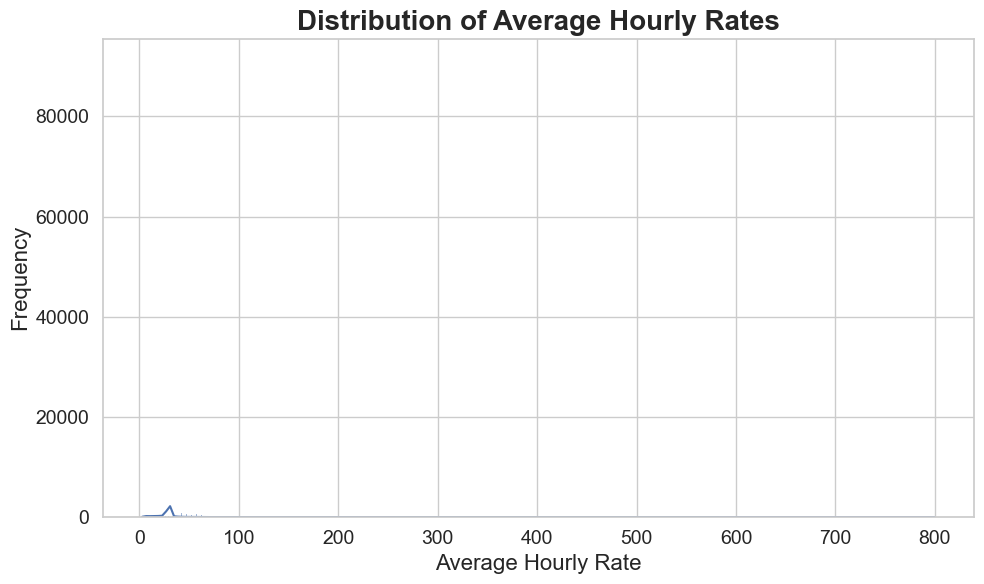

In [117]:
#Enhance distribution plot with KDE and better labels
plt.figure(figsize=(10, 6))
sns.histplot(df2['average_hourly_rate'], kde=True)
plt.title('Distribution of Average Hourly Rates', fontsize=20, fontweight='bold')
plt.xlabel('Average Hourly Rate', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

(array([26.5, 27. , 27.5, 28. , 28.5, 29. , 29.5, 30. ]),
 [Text(0, 26.5, '26.5'),
  Text(0, 27.0, '27.0'),
  Text(0, 27.5, '27.5'),
  Text(0, 28.0, '28.0'),
  Text(0, 28.5, '28.5'),
  Text(0, 29.0, '29.0'),
  Text(0, 29.5, '29.5'),
  Text(0, 30.0, '30.0')])

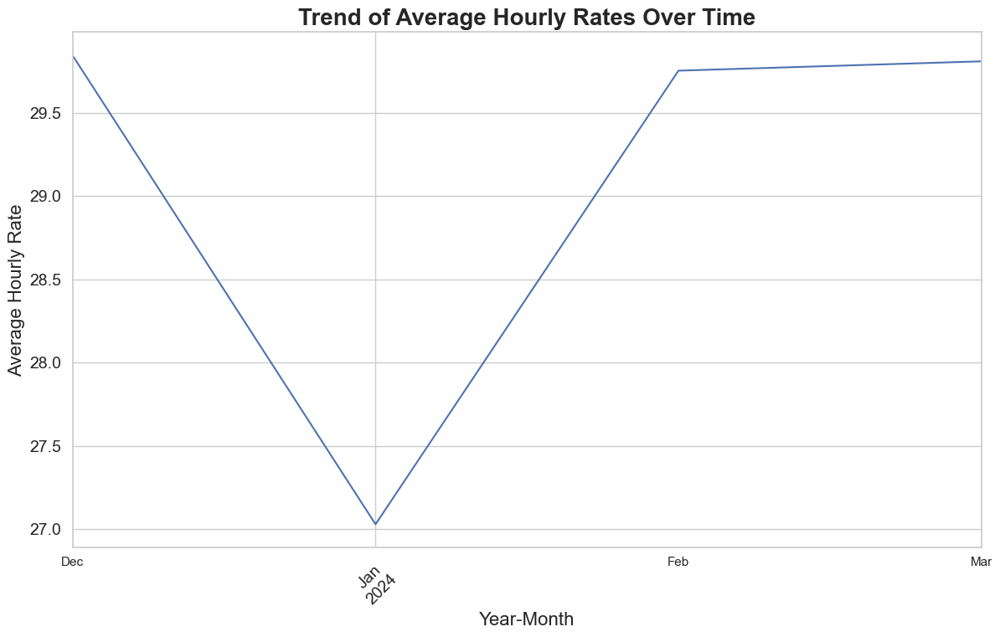

In [118]:
# Enhance time series plot with smoothed trend and forecasts
plt.figure(figsize=(14, 8))
df2.groupby('year_month')['average_hourly_rate'].mean().plot()
plt.title('Trend of Average Hourly Rates Over Time', fontsize=20, fontweight='bold')
plt.xlabel('Year-Month', fontsize=16)
plt.ylabel('Average Hourly Rate', fontsize=16)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)

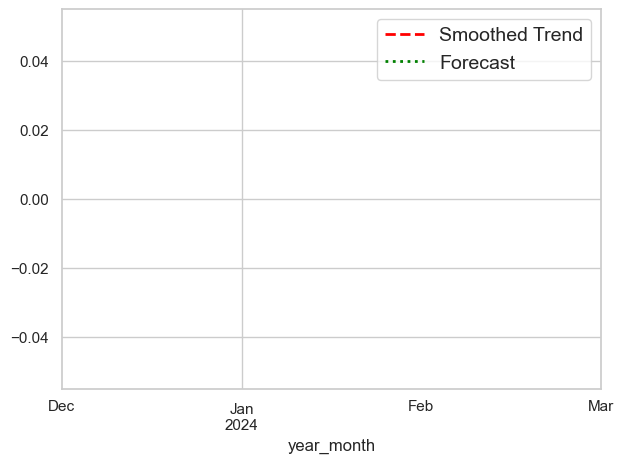

In [119]:
# Example of smoothing the trend with rolling mean
rolling_mean = df2.groupby('year_month')['average_hourly_rate'].mean().rolling(window=6).mean()  # Adjust window size
rolling_mean.plot(label='Smoothed Trend', linestyle='--', linewidth=2, color='red')
# Example of forecasting using simple trend continuation
forecast_end = pd.Timestamp('2025-12-31')  # Adjust as per your forecast horizon
plt.axvline(forecast_end, color='green', linestyle=':', linewidth=2, label='Forecast')
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()


In [120]:
# Assuming df2 is your DataFrame
df.to_csv('task7_data.csv', index=True)


# Task 8: Predict future job market trends

In [121]:
df2.head(2)

,Unnamed: 0,title,link,is_hourly,hourly_low,hourly_high,budget,country,keywords,year_month,average_hourly_rate
published_date,,,,,,,,,,,
2024-02-17 04:09:54-05:00,0,experienced media buyer for solar pannel and r...,https://www.upwork.com/jobs/Experienced-Media-...,False,17.339644,41.97061,500.0,United States,"['experienced', 'media', 'buyer', 'solar', 'pa...",2024-02-01,29.655127
2024-02-17 04:09:17-05:00,1,full stack developer,https://www.upwork.com/jobs/Full-Stack-Develop...,False,17.339644,41.97061,1100.0,United States,"['full', 'stack', 'developer']",2024-02-01,29.655127


In [122]:
df2.columns

Index(['Unnamed: 0', 'title', 'link', 'is_hourly', 'hourly_low', 'hourly_high',
       'budget', 'country', 'keywords', 'year_month', 'average_hourly_rate'],
      dtype='object')

In [123]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 157983 entries, 2024-02-17 04:09:54-05:00 to 2024-02-08 06:28:59-05:00
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Unnamed: 0           157983 non-null  int64         
 1   title                157983 non-null  object        
 2   link                 157983 non-null  object        
 3   is_hourly            157983 non-null  bool          
 4   hourly_low           157983 non-null  float64       
 5   hourly_high          157983 non-null  float64       
 6   budget               157983 non-null  float64       
 7   country              157983 non-null  object        
 8   keywords             157983 non-null  object        
 9   year_month           157983 non-null  datetime64[ns]
 10  average_hourly_rate  157983 non-null  float64       
dtypes: bool(1), datetime64[ns](1), float64(4), int64(1), object(4)
memory usage: 13.4+ M

In [124]:
df2.isnull().sum()

Unnamed: 0             0
title                  0
link                   0
is_hourly              0
hourly_low             0
hourly_high            0
budget                 0
country                0
keywords               0
year_month             0
average_hourly_rate    0
dtype: int64

In [125]:
df2.describe()

,Unnamed: 0,hourly_low,hourly_high,budget,year_month,average_hourly_rate
count,157983.000000,157983.000000,157983.000000,157983.000000,157983,157983.000000
mean,80387.671351,17.377801,42.161888,403.523164,2024-02-11 01:05:31.623022848,29.769845
min,0.000000,3.000000,3.000000,5.000000,2023-12-01 00:00:00,3.000000
25%,39496.500000,15.000000,40.000000,100.000000,2024-02-01 00:00:00,26.000000
50%,79047.000000,17.339644,41.970610,100.000000,2024-02-01 00:00:00,29.655127
75%,118598.500000,17.339644,41.970610,100.000000,2024-03-01 00:00:00,29.655127
max,238145.000000,750.000000,999.000000,1000000.000000,2024-03-01 00:00:00,799.500000
std,47784.219474,11.794353,31.630797,8478.887506,NaN,20.052956


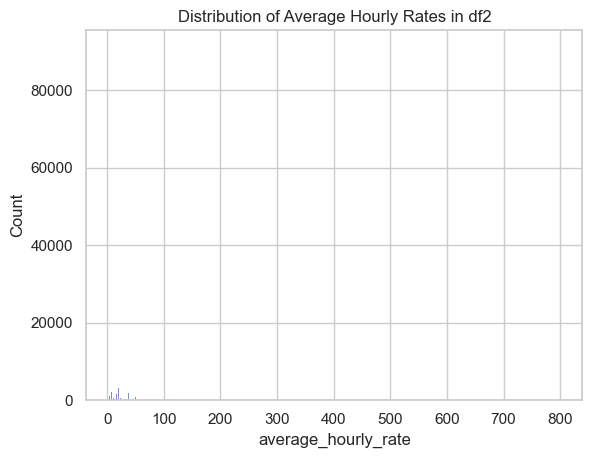

In [126]:
# Distribution of average hourly rates in df2
sns.histplot(df2['average_hourly_rate'])
plt.title('Distribution of Average Hourly Rates in df2')
plt.show()

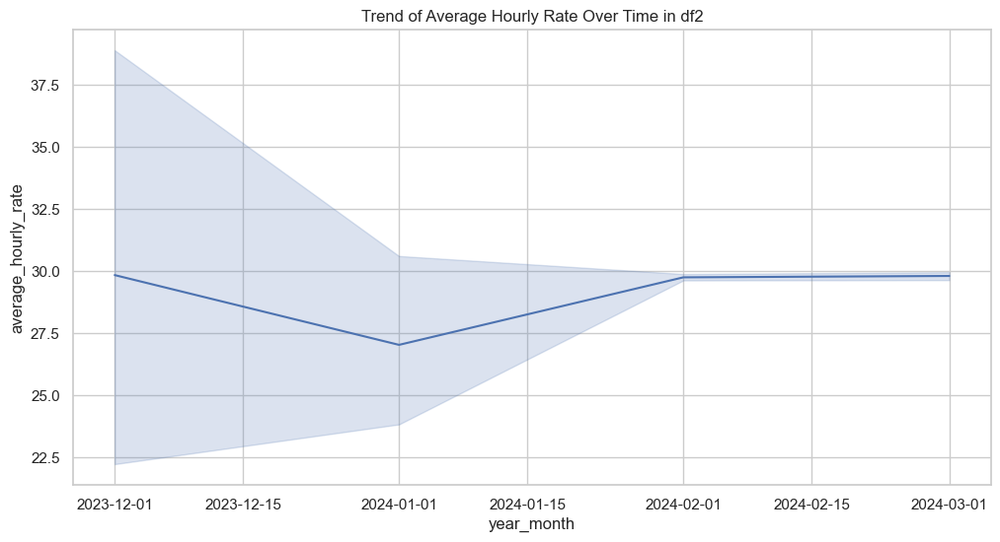

In [127]:
# Trend of average hourly rate over time in df2
plt.figure(figsize=(12,6))
sns.lineplot(x='year_month', y='average_hourly_rate', data=df2)
plt.title('Trend of Average Hourly Rate Over Time in df2')
plt.show()

In [128]:
# Drop unnecessary column if not needed
df2 = df2.drop(columns=['Unnamed: 0'])

# Ensure 'year_month' is datetime type for time series analysis
df2['year_month'] = pd.to_datetime(df2['year_month'])


In [129]:
# Example: Extract month and year as separate features
df2['month'] = df2['year_month'].dt.month
df2['year'] = df2['year_month'].dt.year


### SARIMA Model

In [130]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split

# Split data into train and test sets
train, test = train_test_split(df2, test_size=0.2, shuffle=False)

# Adjust SARIMA parameters to reduce complexity
model = SARIMAX(train['average_hourly_rate'], order=(1, 0, 1), seasonal_order=(0, 0, 0, 0))
results = model.fit()

In [131]:
# Example: Forecast future trends
forecast = results.get_forecast(steps=len(test))
predicted = forecast.predicted_mean
predicted

126386    29.907102
126387    29.907098
126388    29.907094
126389    29.907090
126390    29.907086
            ...    
157978    29.778154
157979    29.778150
157980    29.778145
157981    29.778141
157982    29.778137
Name: predicted_mean, Length: 31597, dtype: float64

In [132]:
rmse = np.sqrt(mean_squared_error(test['average_hourly_rate'], predicted))
print(f'RMSE: {rmse}')

RMSE: 20.317891070256152


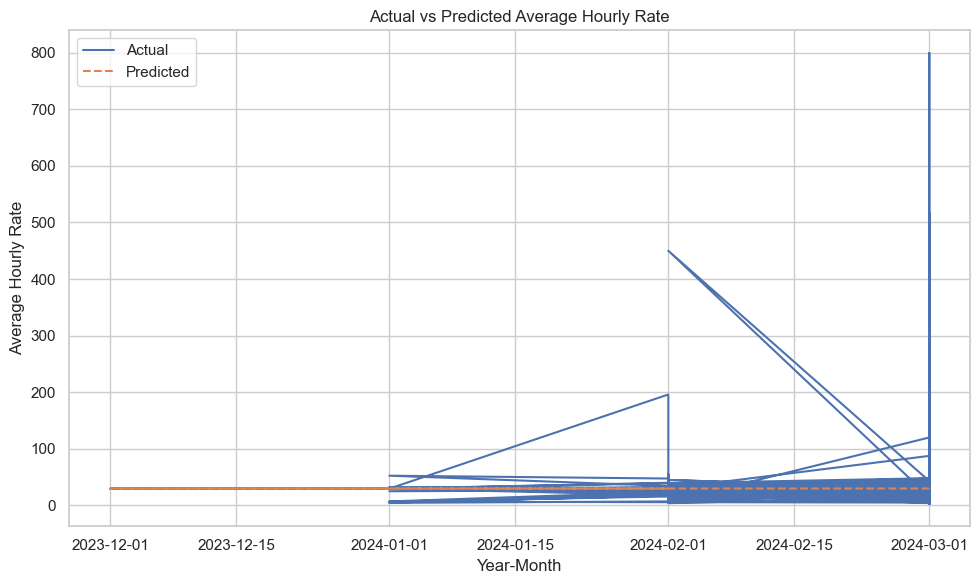

In [133]:
# Example: Plot actual vs predicted
plt.figure(figsize=(10, 6))
plt.plot(test['year_month'], test['average_hourly_rate'], label='Actual')
plt.plot(test['year_month'], predicted, label='Predicted', linestyle='--')
plt.title('Actual vs Predicted Average Hourly Rate')
plt.xlabel('Year-Month')
plt.ylabel('Average Hourly Rate')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [144]:
import joblib

# Save the model to a file
model_filename = 'SARIMA_model.pkl'
joblib.dump(model, model_filename)

['SARIMA_model.pkl']

# linear regression

In [134]:
# Convert categorical variables to numerical using label encoding or one-hot encoding
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df2['country_code'] = encoder.fit_transform(df2['country'])

In [135]:
# Extract relevant features for analysis
features = ['hourly_low', 'hourly_high', 'budget', 'country_code', 'average_hourly_rate']
X = df2[features]

In [136]:
# Define target variable
y = df2['average_hourly_rate']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [137]:
# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on test data
y_pred = model.predict(X_test)


In [138]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 6.808755123840147e-27


In [139]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Calculate additional metrics
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)  # RMSE

print(f'R-squared: {r2}')
print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')


R-squared: 1.0
Mean Absolute Error: 2.232079199201033e-14
Root Mean Squared Error: 8.251518117195252e-14


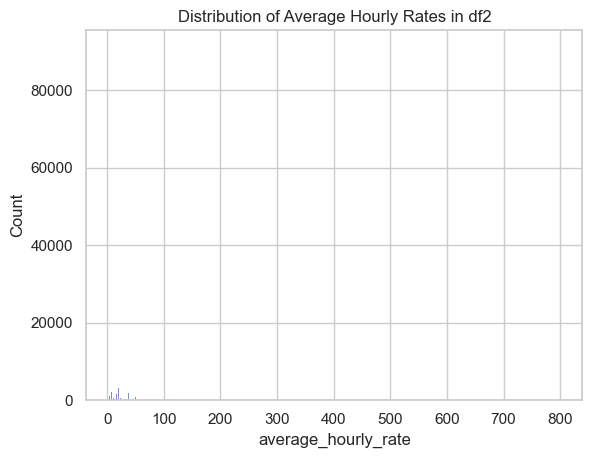

In [141]:
# Distribution of average hourly rates in df2
sns.histplot(df2['average_hourly_rate'])
plt.title('Distribution of Average Hourly Rates in df2')
plt.show()

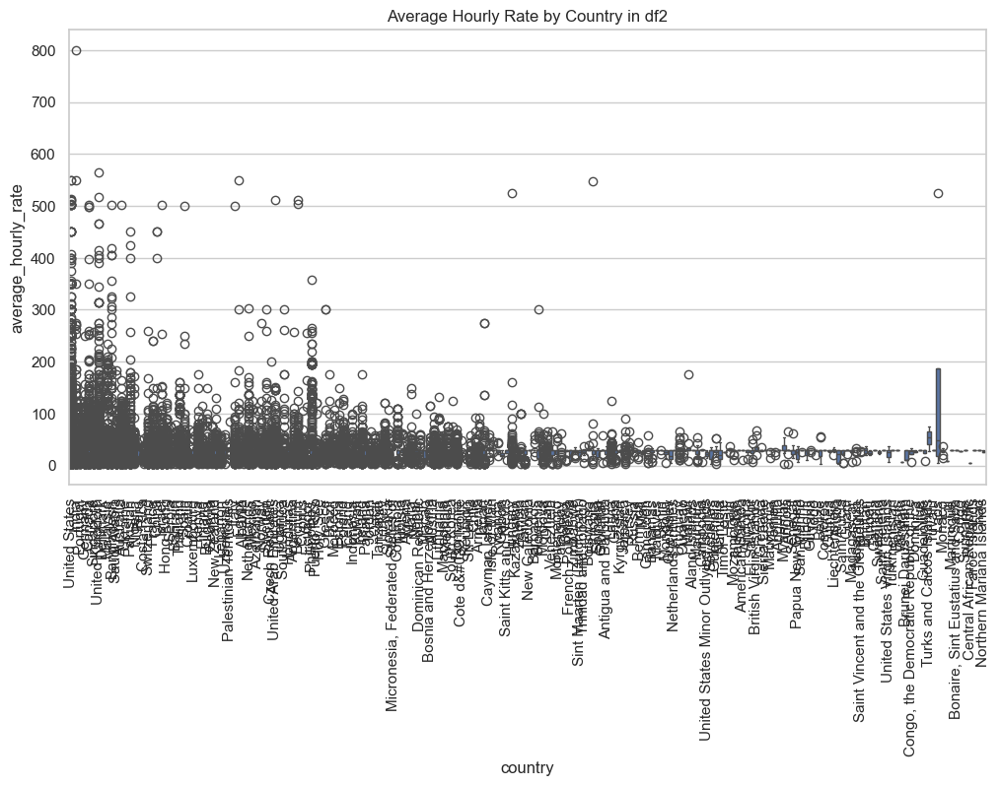

In [142]:
# Relationship between country and average hourly rate in df2
plt.figure(figsize=(12,6))
sns.boxplot(x='country', y='average_hourly_rate', data=df2)
plt.xticks(rotation=90)
plt.title('Average Hourly Rate by Country in df2')
plt.show()

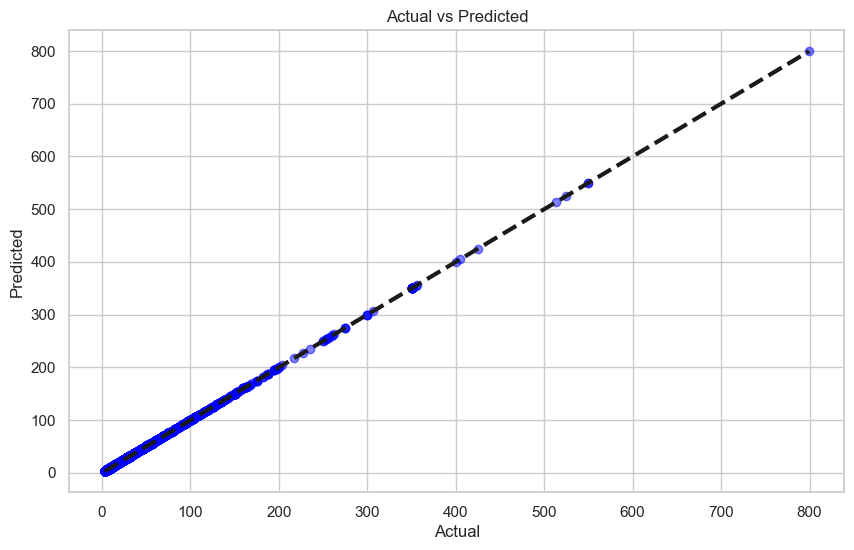

In [143]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()


In [145]:
# Save the model to a file
model_filename = 'job_market_trends_model.pkl'
joblib.dump(model, model_filename)

['job_market_trends_model.pkl']

### ARIMA Model

In [152]:
# Assuming 'average_hourly_rate' is your target variable
y = df2['average_hourly_rate']
X = df2.drop(columns=['average_hourly_rate'])  # Features excluding target

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [153]:
# Fit ARIMA model
arima_model = ARIMA(y_train, order=(5,1,0))  # Example order (p, d, q)
arima_model_fit = arima_model.fit()

# Predictions
arima_predictions = arima_model_fit.forecast(steps=len(y_test))

In [154]:
# Assuming arima_predictions are already defined
arima_mse = mean_squared_error(y_test, arima_predictions)
arima_mae = mean_absolute_error(y_test, arima_predictions)
arima_rmse = mean_squared_error(y_test, arima_predictions, squared=False)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    
    # Handle case where y_true or y_pred contain Timestamps
    if np.issubdtype(y_true.dtype, np.datetime64) or np.issubdtype(y_pred.dtype, np.datetime64):
        y_true = y_true.astype(np.float64)
        y_pred = y_pred.astype(np.float64)
    
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
# Assuming y_test and arima_predictions are defined
arima_mape = mean_absolute_percentage_error(y_test, arima_predictions)

print(f'ARIMA Mean Squared Error: {arima_mse}')
print(f'ARIMA Mean Absolute Error: {arima_mae}')
print(f'ARIMA Root Mean Squared Error: {arima_rmse}')
print(f'ARIMA Mean Absolute Percentage Error: {arima_mape}')


ARIMA Mean Squared Error: 379.04969092445543
ARIMA Mean Absolute Error: 7.284987148823409
ARIMA Root Mean Squared Error: 19.469198517773027
ARIMA Mean Absolute Percentage Error: 42.69259938682299


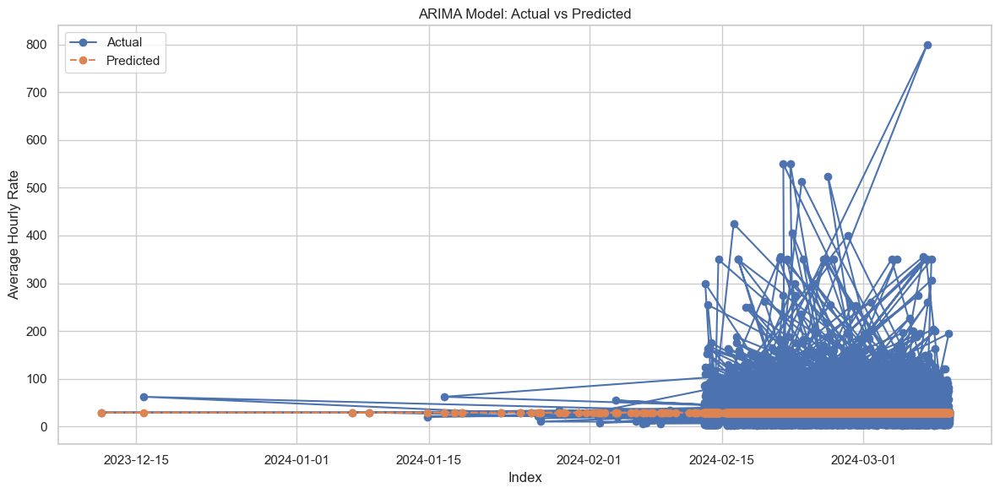

In [155]:
# Plotting actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual', marker='o')
plt.plot(y_test.index, arima_predictions, label='Predicted', linestyle='--', marker='o')
plt.title('ARIMA Model: Actual vs Predicted')
plt.xlabel('Index')
plt.ylabel('Average Hourly Rate')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [156]:
# Ensure y_test and arima_predictions have aligned indices
y_test = y_test[y_test.index.isin(arima_predictions.index)]
arima_predictions = arima_predictions[arima_predictions.index.isin(y_test.index)]

In [157]:
# Calculate residuals
residuals = y_test - arima_predictions
residuals

Series([], dtype: float64)

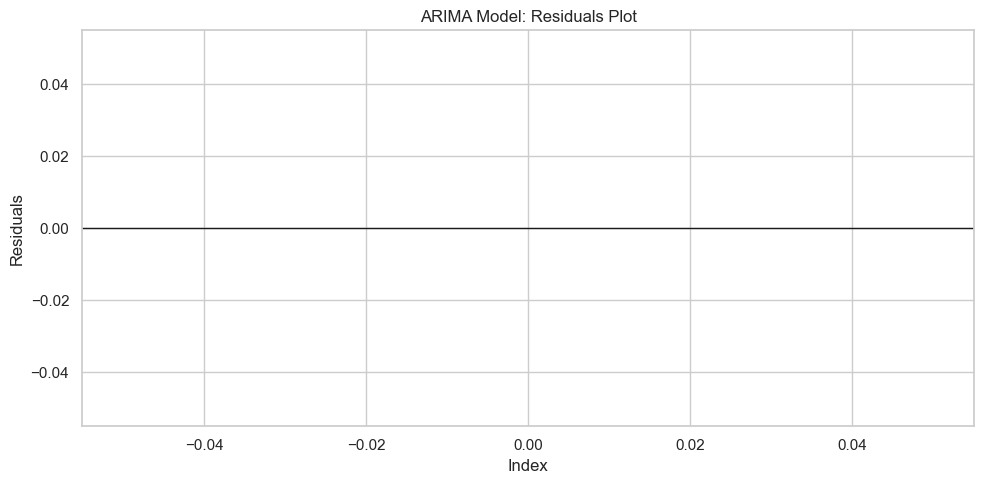

In [158]:
# Plotting residuals
plt.figure(figsize=(10, 5))
plt.plot(y_test.index, residuals, marker='o', linestyle='None', color='r')
plt.axhline(y=0, color='k', linestyle='-', linewidth=1)
plt.title('ARIMA Model: Residuals Plot')
plt.xlabel('Index')
plt.ylabel('Residuals')
plt.grid(True)
plt.tight_layout()
plt.show()

In [160]:
# Save the model with compression
joblib.dump(model, 'arima_model_compressed.pkl', compress=3)

['arima_model_compressed.pkl']

In [151]:
# Assuming df2 is your DataFrame
df2.to_csv('task8_data.csv', index=True)